# Setup

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import warnings

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns # visualization library
import matplotlib.pyplot as plt # visualization library
from plotly.offline import init_notebook_mode, iplot # plotly offline mode
import plotly.graph_objs as go # plotly graphical object


import src.data.timeseries_eda as eda 

init_notebook_mode(connected=True)
# ignore filters
warnings.filterwarnings("ignore") # if there is a warning after some codes, this will avoid us to see them.
plt.style.use('ggplot')

# config

In [3]:
symbol = 'EURUSD'

# EDA

In [4]:
market_data = pd.read_csv(f'data/{symbol}_1h.csv')
market_data.head()

,Unnamed: 0,open_time,open_bid,low_bid,high_bid,close_bid,volume_bid,open_ask,low_ask,high_ask,close_ask,volume_ask,close_time,month,year
0,0,2015-02-02 01:00:00,1.13082,1.13082,1.13157,1.13153,2712.48,1.13086,1.13086,1.13160,1.13156,2853.70,2015-02-02 02:00:00,2,2015
1,1,2015-02-02 02:00:00,1.13152,1.13135,1.13255,1.13179,2935.13,1.13156,1.13136,1.13257,1.13181,2945.25,2015-02-02 03:00:00,2,2015
2,2,2015-02-02 03:00:00,1.13180,1.13054,1.13180,1.13102,2610.78,1.13181,1.13057,1.13185,1.13103,2617.55,2015-02-02 04:00:00,2,2015
3,3,2015-02-02 04:00:00,1.13101,1.13084,1.13132,1.13084,1723.14,1.13103,1.13088,1.13136,1.13088,1489.47,2015-02-02 05:00:00,2,2015
4,4,2015-02-02 05:00:00,1.13085,1.13071,1.13134,1.13084,1966.10,1.13088,1.13073,1.13136,1.13085,1753.40,2015-02-02 06:00:00,2,2015


In [5]:
market_data['open_time'] = pd.to_datetime(market_data['open_time'])
market_data.set_index('open_time', inplace=True)

market_data.drop(columns='close_time', inplace=True)

In [6]:
stationary.check('close_ask')
stationary.plot('close_ask')

NameError: name 'stationary' is not defined

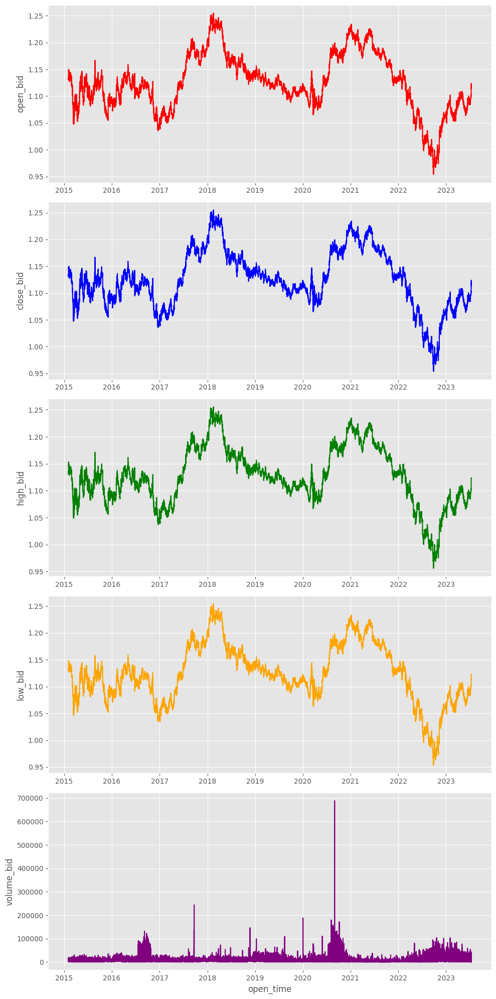

In [7]:
eda.plot_price_volume(market_data, kind = 'bid')

In [8]:
eda.plot_candlestick(market_data, kind = 'bid')

In [9]:
normality_checker = eda.Normality(market_data)
list_of_features_to_be_normalized = []
for col in market_data.columns:
    if normality_checker.check(col):
       continue
    list_of_features_to_be_normalized.append(col)
list_of_features_to_be_normalized 

['Unnamed: 0',
 'open_bid',
 'low_bid',
 'high_bid',
 'close_bid',
 'volume_bid',
 'open_ask',
 'low_ask',
 'high_ask',
 'close_ask',
 'volume_ask',
 'month',
 'year']

# Features Engineering

In [10]:
from src.data.feature_engineering import PercentageFeatureAdder, BollingerBandAdder, TargetAdder,Scalar

percentage_feature_adder = PercentageFeatureAdder(1)
bidbb_adder = BollingerBandAdder(kind = 'bid')
askbb_adder = BollingerBandAdder(kind = 'ask')


pipeline = [bidbb_adder, askbb_adder, percentage_feature_adder]

In [11]:
transformed = market_data.copy()
for idx , trans in enumerate(pipeline):
    print(f'Transformation number: {idx + 1}')
    transformed = trans.transform(transformed)

Transformation number: 1
Transformation number: 2
Transformation number: 3


In [12]:
stationary_checker = eda.Stationary(transformed)
normality_checker = eda.Normality(transformed)

ready_to_train_features = []
for col in transformed.columns:
    if not stationary_checker.check(col) :
       continue
    ready_to_train_features.append(col)

ready_to_train_features

checking stationarity for Unnamed: 0


ADF Statistic: -0.4786964044919784
p-value: 0.8961071336037401
Is stationary: False
checking stationarity for open_bid
ADF Statistic: -2.473211872347423
p-value: 0.12212894590271328
Is stationary: False
checking stationarity for low_bid
ADF Statistic: -2.488818586861005
p-value: 0.11821864083930733
Is stationary: False
checking stationarity for high_bid
ADF Statistic: -2.4839730054906273
p-value: 0.11942272295404788
Is stationary: False
checking stationarity for close_bid
ADF Statistic: -2.487968724873902
p-value: 0.11842917481029186
Is stationary: False
checking stationarity for volume_bid
ADF Statistic: -6.905789751500843
p-value: 1.2483024088338616e-09
Is stationary: True
checking stationarity for open_ask
ADF Statistic: -2.474866432570156
p-value: 0.12170996038703347
Is stationary: False
checking stationarity for low_ask
ADF Statistic: -2.488230007540732
p-value: 0.11836441861345248
Is stationary: False
checking stationarity for high_ask
ADF Statistic: -2.4838623315811272
p-value: 

['volume_bid',
 'volume_ask',
 'month',
 'bid_golden/death',
 'bid_standard_deviation',
 'bid_bollinger_touch',
 'ask_golden/death',
 'ask_standard_deviation',
 'ask_bollinger_touch',
 'hhpc_bid_1',
 'llpc_bid_1',
 'hhpc_bid_3',
 'llpc_bid_3',
 'hplpcp_bid_1',
 'hplpcp_bid_3',
 'hplpcp_bid_4',
 'vvpavg3_bid',
 'vvp3avg3_bid',
 'hc_bid',
 'ho_bid',
 'co_bid',
 'hhpc_ask_1',
 'llpc_ask_1',
 'hhpc_ask_3',
 'llpc_ask_3',
 'hplpcp_ask_1',
 'hplpcp_ask_3',
 'hplpcp_ask_4',
 'vvpavg3_ask',
 'vvp3avg3_ask',
 'hc_ask',
 'ho_ask',
 'co_ask']

In [13]:
target_adder = TargetAdder(step_number=1 , look_back_steps =2)
transformed

,Unnamed: 0,open_bid,low_bid,high_bid,close_bid,volume_bid,open_ask,low_ask,high_ask,close_ask,...,hhpc_ask_3,llpc_ask_3,hplpcp_ask_1,hplpcp_ask_3,hplpcp_ask_4,vvpavg3_ask,vvp3avg3_ask,hc_ask,ho_ask,co_ask
open_time,,,,,,,,,,,,,,,,,,,,,
2015-02-03 06:00:00,29,1.13314,1.13260,1.13392,1.13387,3575.43,1.13316,1.13263,1.13395,1.13391,...,-0.000564,-0.000194,0.000980,0.001536,0.000715,0.009180,-0.190700,0.000035,0.000697,0.000662
2015-02-03 07:00:00,30,1.13387,1.13271,1.13475,1.13316,7018.44,1.13391,1.13274,1.13478,1.13319,...,0.001288,0.000168,0.001164,0.000679,0.001534,0.809215,0.696656,0.001401,0.000767,-0.000635
2015-02-03 08:00:00,31,1.13316,1.13216,1.13518,1.13243,11231.82,1.13320,1.13218,1.13521,1.13246,...,0.001660,-0.000035,0.001800,0.000979,0.000679,0.503776,1.037695,0.002422,0.001771,-0.000653
2015-02-03 09:00:00,32,1.13244,1.13124,1.13437,1.13334,10326.65,1.13246,1.13127,1.13438,1.13340,...,0.000379,-0.001200,0.002676,0.001166,0.000980,-0.108077,0.688065,0.000864,0.001693,0.000830
2015-02-03 10:00:00,33,1.13332,1.13317,1.13547,1.13504,7146.93,1.13340,1.13319,1.13549,1.13508,...,0.000625,0.000396,0.002744,0.001800,0.001165,-0.239124,0.037527,0.000361,0.001841,0.001482
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-14 00:00:00,52651,1.12244,1.12217,1.12280,1.12237,6880.17,1.12248,1.12220,1.12283,1.12241,...,0.000027,-0.000205,0.000499,0.000330,0.000668,0.844133,0.731353,0.000374,0.000312,-0.000062
2023-07-14 01:00:00,52652,1.12237,1.12134,1.12247,1.12229,16004.12,1.12240,1.12136,1.12249,1.12233,...,-0.000178,-0.000535,0.000561,0.000650,0.000330,1.057975,1.699762,0.000143,0.000080,-0.000062
2023-07-14 02:00:00,52653,1.12229,1.12221,1.12337,1.12336,19662.13,1.12232,1.12224,1.12341,1.12340,...,0.000374,-0.000169,0.001007,0.000499,0.000650,0.204334,1.104133,0.000009,0.000970,0.000962


In [14]:
target_adder.transform(transformed)

,Unnamed: 0,open_bid,low_bid,high_bid,close_bid,volume_bid,open_ask,low_ask,high_ask,close_ask,...,hplpcp_ask_4,vvpavg3_ask,vvp3avg3_ask,hc_ask,ho_ask,co_ask,high_bid_change_rate_target,low_ask_change_rate_target,last_open_ask,last_open_bid
open_time,,,,,,,,,,,,,,,,,,,,,
2015-02-03 06:00:00,29,1.13314,1.13260,1.13392,1.13387,3575.43,1.13316,1.13263,1.13395,1.13391,...,0.000715,0.009180,-0.190700,0.000035,0.000697,0.000662,NaN,NaN,NaN,NaN
2015-02-03 07:00:00,30,1.13387,1.13271,1.13475,1.13316,7018.44,1.13391,1.13274,1.13478,1.13319,...,0.001534,0.809215,0.696656,0.001401,0.000767,-0.000635,NaN,NaN,NaN,NaN
2015-02-03 08:00:00,31,1.13316,1.13216,1.13518,1.13243,11231.82,1.13320,1.13218,1.13521,1.13246,...,0.000679,0.503776,1.037695,0.002422,0.001771,-0.000653,0.178263,0.084720,1.13316,1.13314
2015-02-03 09:00:00,32,1.13244,1.13124,1.13437,1.13334,10326.65,1.13246,1.13127,1.13438,1.13340,...,0.000980,-0.108077,0.688065,0.000864,0.001693,0.000830,0.040570,0.229299,1.13391,1.13387
2015-02-03 10:00:00,33,1.13332,1.13317,1.13547,1.13504,7146.93,1.13340,1.13319,1.13549,1.13508,...,0.001165,-0.239124,0.037527,0.000361,0.001841,0.001482,0.200316,-0.002651,1.13320,1.13316
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-14 00:00:00,52651,1.12244,1.12217,1.12280,1.12237,6880.17,1.12248,1.12220,1.12283,1.12241,...,0.000668,0.844133,0.731353,0.000374,0.000312,-0.000062,0.036526,0.016038,1.12239,1.12238
2023-07-14 01:00:00,52652,1.12237,1.12134,1.12247,1.12229,16004.12,1.12240,1.12136,1.12249,1.12233,...,0.000330,1.057975,1.699762,0.000143,0.000080,-0.000062,-0.002666,0.096222,1.12250,1.12244
2023-07-14 02:00:00,52653,1.12229,1.12221,1.12337,1.12336,19662.13,1.12232,1.12224,1.12341,1.12340,...,0.000650,0.204334,1.104133,0.000009,0.000970,0.000962,0.079290,0.017821,1.12248,1.12244


In [15]:
normality_checker = eda.Normality(transformed.iloc[-2000:])

In [16]:
normality_checker.check('high_bid_change_rate_target')

False

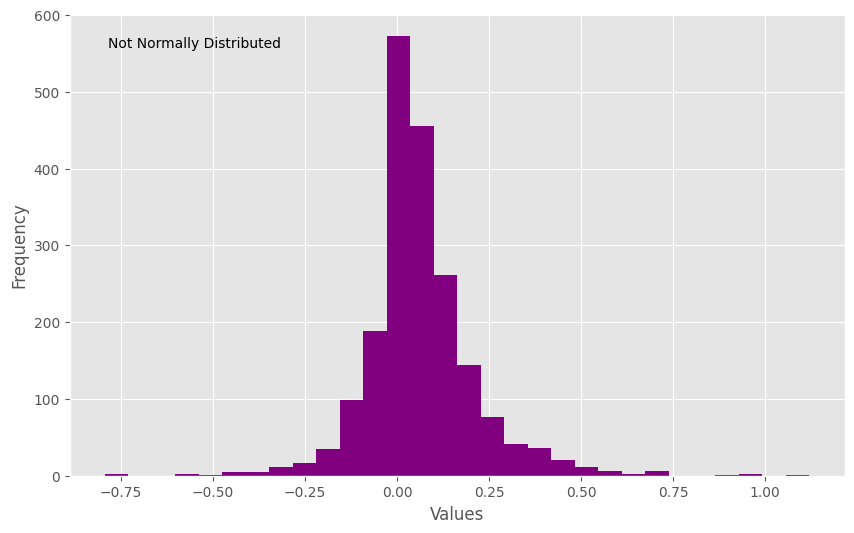

In [17]:
normality_checker.plot('high_bid_change_rate_target')

<Axes: >

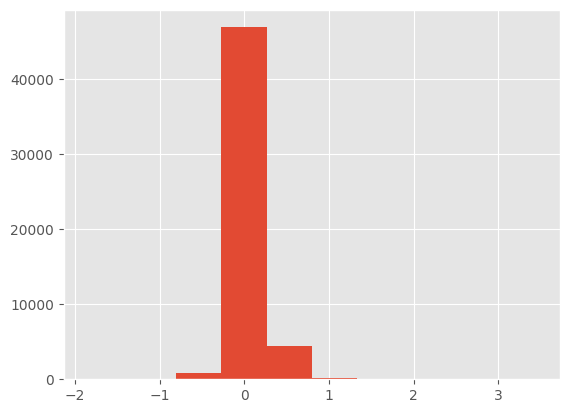

In [18]:
transformed['high_bid_change_rate_target'].hist()

In [19]:
# add retransform method to the target adder (goining from target to abs price) dobe 
# Scaler(Tranformer) , transform and retransform , scale a set of input features (fit, transform, retransform) done 
# Dataset class for your Pytorch model  
# train your model and try to refactor the training code to be re-usable
# evaluatin of models think about adding metrics and plots 
# move the Wavelet to the feature eng part and make it as a Tranformer: implementation done 
#    * denoise input data then make features 
#    * denoise the features directly 
# prepare in the evalutaion part a way to copmare the models performance 
# add the mlp auto-encoder denoiser and try to copmare results ( no-denoising vs wavelet vs auto-encoder) 

In [20]:
transformed.columns

Index(['Unnamed: 0', 'open_bid', 'low_bid', 'high_bid', 'close_bid',
       'volume_bid', 'open_ask', 'low_ask', 'high_ask', 'close_ask',
       'volume_ask', 'month', 'year', 'bid_golden/death',
       'bid_standard_deviation', 'bid_upper_band', 'bid_lower_band',
       'bid_middle_band', 'bid_bollinger_touch', 'ask_golden/death',
       'ask_standard_deviation', 'ask_upper_band', 'ask_lower_band',
       'ask_middle_band', 'ask_bollinger_touch', 'hhpc_bid_1', 'llpc_bid_1',
       'hhpc_bid_3', 'llpc_bid_3', 'hplpcp_bid_1', 'hplpcp_bid_3',
       'hplpcp_bid_4', 'vvpavg3_bid', 'vvp3avg3_bid', 'hc_bid', 'ho_bid',
       'co_bid', 'hhpc_ask_1', 'llpc_ask_1', 'hhpc_ask_3', 'llpc_ask_3',
       'hplpcp_ask_1', 'hplpcp_ask_3', 'hplpcp_ask_4', 'vvpavg3_ask',
       'vvp3avg3_ask', 'hc_ask', 'ho_ask', 'co_ask',
       'high_bid_change_rate_target', 'low_ask_change_rate_target',
       'last_open_ask', 'last_open_bid'],
      dtype='object')

In [21]:
feature=ready_to_train_features
target=['high_bid_change_rate_target', 'low_ask_change_rate_target']

# Models Training

In [22]:
from src.data.dataloader import CreateDataset

my_dataset = CreateDataset(transformed, 10, feature, target)

train_data, valid_data, test_data = my_dataset.dataset_split(0.7,0.2)

In [23]:
from src.data.feature_engineering import Scalar
scalar = Scalar()
train_data[feature] = scalar.fit_transform(train_data[feature])
valid_data[feature] = scalar.transform(valid_data[feature])
test_data[feature] = scalar.transform(test_data[feature])

train_dataset = my_dataset.create_dataset(train_data)
valid_dataset = my_dataset.create_dataset(valid_data)
test_dataset = my_dataset.create_dataset(test_data)

train_loader = my_dataset.create_loader(train_dataset, 128)
valid_loader = my_dataset.create_loader(valid_dataset, 128)
test_loader = my_dataset.create_loader(test_dataset, 128)

In [24]:
DEVICE = 'cuda' 
BATCH_SIZE = 32 
MAX_WAIT = 3
EPOCHS = 25 
LR = 1e-4

In [25]:
from src.models import nn_trainer, lstm_forecaster
import torch
import torch.nn as nn
import torch.optim.lr_scheduler as lr_scheduler


rnn_model = lstm_forecaster.LstmAutoEncoder(
    input_layer=len(feature)
)

loss_fn = nn.MSELoss() 
optimizer = torch.optim.AdamW(params = rnn_model.parameters() , lr = LR)
scheduler = lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

In [26]:

train_rnn = nn_trainer.Trainer(rnn_model , optimizer , train_loader , valid_loader, EPOCHS, MAX_WAIT, DEVICE, loss_fn,scheduler)
train_losses , valid_losses = train_rnn.fit()

  0%|          | 0/288 [00:00<?, ?it/s]

RuntimeError: input.size(-1) must be equal to input_size. Expected 33, got 330

# Evaluation

In [ ]:
from src.eval.metrics import ForecastEval

In [ ]:
indexes , high_bid_predictions, low_ask_predictions = train_rnn.predict(test_loader)
indexes_datetime = pd.to_datetime(indexes)
indexes_datetime 

DatetimeIndex(['2022-09-06 01:00:00', '2022-09-06 02:00:00',
               '2022-09-06 03:00:00', '2022-09-06 04:00:00',
               '2022-09-06 05:00:00', '2022-09-06 06:00:00',
               '2022-09-06 07:00:00', '2022-09-06 08:00:00',
               '2022-09-06 09:00:00', '2022-09-06 10:00:00',
               ...
               '2023-07-13 19:00:00', '2023-07-13 20:00:00',
               '2023-07-13 21:00:00', '2023-07-13 22:00:00',
               '2023-07-13 23:00:00', '2023-07-14 00:00:00',
               '2023-07-14 01:00:00', '2023-07-14 02:00:00',
               '2023-07-14 03:00:00', '2023-07-14 04:00:00'],
              dtype='datetime64[ns]', length=5248, freq=None)

In [ ]:
predictions = pd.DataFrame(
    data = {
        'high_bid_change_rate_target': high_bid_predictions,
        'low_ask_change_rate_target': low_ask_predictions,
    },
    index = indexes_datetime
)   
predictions[['last_open_ask','last_open_bid']] = test_data[['last_open_ask','last_open_bid']]
predictions.head()

,high_bid_change_rate_target,low_ask_change_rate_target,last_open_ask,last_open_bid
2022-09-06 01:00:00,0.063299,0.057346,0.99420,0.99413
2022-09-06 02:00:00,0.063317,0.057339,0.99506,0.99501
2022-09-06 03:00:00,0.063340,0.057336,0.99689,0.99682
2022-09-06 04:00:00,0.063311,0.057313,0.99643,0.99640
2022-09-06 05:00:00,0.063331,0.057330,0.99590,0.99585


In [ ]:
predictions = target_adder.retransform(predictions)
predictions

,high_bid_change_rate_target,low_ask_change_rate_target,last_open_ask,last_open_bid,high_bid,low_ask
2022-09-06 01:00:00,0.063299,0.057346,0.99420,0.99413,0.994829,0.993560
2022-09-06 02:00:00,0.063317,0.057339,0.99506,0.99501,0.995690,0.994439
2022-09-06 03:00:00,0.063340,0.057336,0.99689,0.99682,0.997521,0.996248
2022-09-06 04:00:00,0.063311,0.057313,0.99643,0.99640,0.997061,0.995829
2022-09-06 05:00:00,0.063331,0.057330,0.99590,0.99585,0.996531,0.995279
...,...,...,...,...,...,...
2023-07-14 00:00:00,0.063064,0.057255,1.12239,1.12238,1.123098,1.121737
2023-07-14 01:00:00,0.063070,0.057267,1.12250,1.12244,1.123208,1.121797
2023-07-14 02:00:00,0.063163,0.057312,1.12248,1.12244,1.123189,1.121797
2023-07-14 03:00:00,0.063243,0.057356,1.12240,1.12237,1.123110,1.121726


In [ ]:
market_data

,Unnamed: 0,open_bid,low_bid,high_bid,close_bid,volume_bid,open_ask,low_ask,high_ask,close_ask,volume_ask,month,year
open_time,,,,,,,,,,,,,
2015-02-02 01:00:00,0,1.13082,1.13082,1.13157,1.13153,2712.48,1.13086,1.13086,1.13160,1.13156,2853.700,2,2015
2015-02-02 02:00:00,1,1.13152,1.13135,1.13255,1.13179,2935.13,1.13156,1.13136,1.13257,1.13181,2945.250,2,2015
2015-02-02 03:00:00,2,1.13180,1.13054,1.13180,1.13102,2610.78,1.13181,1.13057,1.13185,1.13103,2617.550,2,2015
2015-02-02 04:00:00,3,1.13101,1.13084,1.13132,1.13084,1723.14,1.13103,1.13088,1.13136,1.13088,1489.470,2,2015
2015-02-02 05:00:00,4,1.13085,1.13071,1.13134,1.13084,1966.10,1.13088,1.13073,1.13136,1.13085,1753.400,2,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-14 00:00:00,52651,1.12244,1.12217,1.12280,1.12237,6880.17,1.12248,1.12220,1.12283,1.12241,4729.360,7,2023
2023-07-14 01:00:00,52652,1.12237,1.12134,1.12247,1.12229,16004.12,1.12240,1.12136,1.12249,1.12233,11233.430,7,2023
2023-07-14 02:00:00,52653,1.12229,1.12221,1.12337,1.12336,19662.13,1.12232,1.12224,1.12341,1.12340,13221.189,7,2023


In [ ]:
orginal_test_data = market_data[['open_ask','open_bid','low_ask','high_bid','close_bid','close_ask']].loc[predictions.index]

<Axes: >

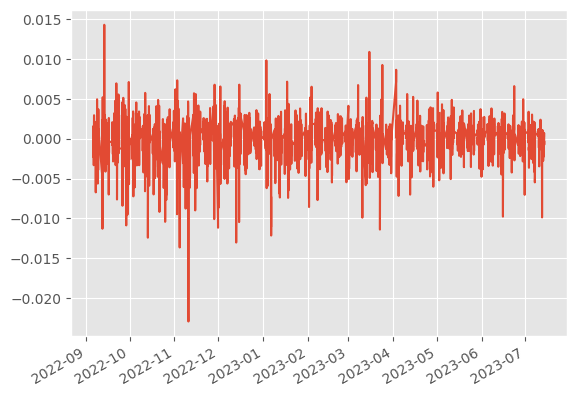

In [ ]:
(predictions['high_bid'] - orginal_test_data['high_bid']).plot()

In [ ]:
def add_noise_to_feature(feature_data, noise_std):
    noisy_feature_data = feature_data + np.random.normal(0, noise_std, size=feature_data.shape)
    return noisy_feature_data

In [ ]:
results = pd.DataFrame(columns=['Feature', 'High Bid Loss', 'Low Ask Loss'])
noise_std = 0.5
for feature_name in feature:
    noisy_data = test_data.copy()
    noisy_feature_data = add_noise_to_feature(noisy_data[feature_name], noise_std)
    noisy_data[feature_name] = noisy_feature_data

    
    test_dataset.features_data = noisy_data[feature].values
    test_loader = my_dataset.create_loader(test_dataset, batch_size=128)


    indexes, high_bid_predictions, low_ask_predictions = train_rnn.predict(test_loader)
    indexes = pd.to_datetime(indexes)
    high_bid_target = test_dataset.target_data[10:][:, 0]  
    low_ask_target = test_dataset.target_data[10:][:, 1]  

    high_bid_loss = loss_fn(torch.tensor(high_bid_predictions), torch.tensor(high_bid_target)).item()
    low_ask_loss = loss_fn(torch.tensor(low_ask_predictions), torch.tensor(low_ask_target)).item()

    
    new_row = {'Feature': feature_name,
               'High Bid Loss': high_bid_loss,
               'Low Ask Loss': low_ask_loss}
    results = pd.concat([results, pd.DataFrame([new_row])], ignore_index=True)

print(results)
    
    


                   Feature  High Bid Loss  Low Ask Loss
0               volume_bid       0.042261      0.040146
1               volume_ask       0.042281      0.040133
2                    month       0.042232      0.040135
3         bid_golden/death       0.042265      0.040135
4   bid_standard_deviation       0.042272      0.040132
5      bid_bollinger_touch       0.042285      0.040146
6         ask_golden/death       0.042297      0.040131
7   ask_standard_deviation       0.042253      0.040137
8      ask_bollinger_touch       0.042257      0.040146
9               hhpc_bid_1       0.042253      0.040138
10              llpc_bid_1       0.042264      0.040140
11              hhpc_bid_3       0.042275      0.040164
12              llpc_bid_3       0.042255      0.040136
13            hplpcp_bid_1       0.042262      0.040153
14            hplpcp_bid_3       0.042276      0.040148
15            hplpcp_bid_4       0.042279      0.040136
16             vvpavg3_bid       0.042282      0

In [ ]:
results = pd.DataFrame(columns=['Feature', 'High Bid Loss', 'Low Ask Loss'])
noise_std = 0.5
for feature_name in feature:
    noisy_data = test_data.copy()
    noisy_feature_data = add_noise_to_feature(noisy_data[feature_name], noise_std)
    noisy_data[feature_name] = noisy_feature_data

    test_dataset.features_data = noisy_data[feature].values
    test_loader = my_dataset.create_loader(test_dataset, batch_size=128)

    indexes, high_bid_predictions, low_ask_predictions = train_rnn.predict(test_loader)
    indexes_datetime = pd.to_datetime(indexes)
    
    predictions = pd.DataFrame(
        data = {
            'high_bid_change_rate_target': high_bid_predictions,
            'low_ask_change_rate_target': low_ask_predictions,
        },
        index = indexes_datetime
    )
    
    predictions[['last_open_ask', 'last_open_bid']] = test_data[['last_open_ask', 'last_open_bid']]
    predictions = target_adder.retransform(predictions)
    orginal_test_data = market_data[['low_ask', 'high_bid']].loc[predictions.index]
    
    
    high_bid_diff = abs(predictions['high_bid'] - orginal_test_data['high_bid'])
    low_ask_diff = abs(predictions['low_ask'] - orginal_test_data['low_ask'])
    
    
    high_bid_loss = high_bid_diff.sum()
    low_ask_loss = low_ask_diff.sum()
    
    
    new_row = {'Feature': feature_name,
               'High Bid Loss': high_bid_loss,
               'Low Ask Loss': low_ask_loss}
    results = pd.concat([results, pd.DataFrame([new_row])], ignore_index=True)

print(results)

                   Feature  High Bid Loss  Low Ask Loss
0               volume_bid       7.264096      7.299676
1               volume_ask       7.274247      7.296208
2                    month       7.264959      7.295688
3         bid_golden/death       7.265194      7.295936
4   bid_standard_deviation       7.265361      7.297927
5      bid_bollinger_touch       7.265480      7.295059
6         ask_golden/death       7.265311      7.296408
7   ask_standard_deviation       7.265661      7.296933
8      ask_bollinger_touch       7.266104      7.295379
9               hhpc_bid_1       7.271296      7.294926
10              llpc_bid_1       7.267147      7.295731
11              hhpc_bid_3       7.268553      7.297818
12              llpc_bid_3       7.269721      7.296290
13            hplpcp_bid_1       7.266493      7.296432
14            hplpcp_bid_3       7.268025      7.295873
15            hplpcp_bid_4       7.268472      7.295737
16             vvpavg3_bid       7.266765      7

Position Accuracy: 4.02%
ABS error:  29081.459727767975


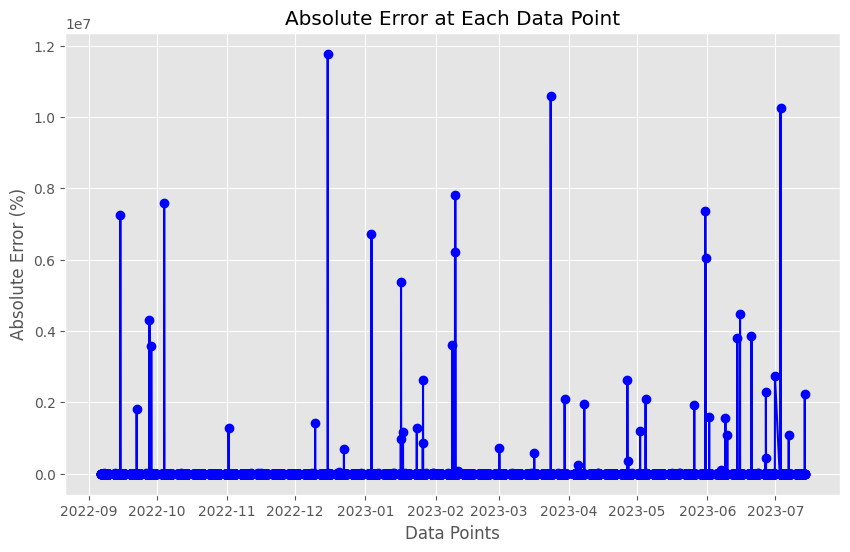

In [ ]:
evaluator= ForecastEval(orginal_data= orginal_test_data , predicted_data = predictions)
evaluator.run_evaluation()

In [ ]:
(orginal_test_data['high_bid']>predictions['high_bid']).mean()*100

46.81783536585366

In [ ]:
(orginal_test_data['low_ask']>predictions['low_ask']).mean()*100

53.33460365853659

In [ ]:
predictions

,high_bid_change_rate_target,low_ask_change_rate_target,last_open_ask,last_open_bid,high_bid,low_ask
2022-09-06 01:00:00,0.063299,0.057346,0.99420,0.99413,0.994829,0.993560
2022-09-06 02:00:00,0.063317,0.057339,0.99506,0.99501,0.995690,0.994439
2022-09-06 03:00:00,0.063340,0.057336,0.99689,0.99682,0.997521,0.996248
2022-09-06 04:00:00,0.063311,0.057313,0.99643,0.99640,0.997061,0.995829
2022-09-06 05:00:00,0.063331,0.057330,0.99590,0.99585,0.996531,0.995279
...,...,...,...,...,...,...
2023-07-14 00:00:00,0.063064,0.057255,1.12239,1.12238,1.123098,1.121737
2023-07-14 01:00:00,0.063070,0.057267,1.12250,1.12244,1.123208,1.121797
2023-07-14 02:00:00,0.063163,0.057312,1.12248,1.12244,1.123189,1.121797
2023-07-14 03:00:00,0.063243,0.057356,1.12240,1.12237,1.123110,1.121726


In [ ]:
orginal_test_data

,open_ask,open_bid,low_ask,high_bid,close_bid,close_ask
2022-09-06 01:00:00,0.99689,0.99682,0.99615,0.99706,0.99640,0.99646
2022-09-06 02:00:00,0.99643,0.99640,0.99497,0.99642,0.99585,0.99591
2022-09-06 03:00:00,0.99590,0.99585,0.99430,0.99589,0.99440,0.99444
2022-09-06 04:00:00,0.99446,0.99440,0.99443,0.99548,0.99461,0.99466
2022-09-06 05:00:00,0.99467,0.99461,0.99451,0.99649,0.99590,0.99597
...,...,...,...,...,...,...
2023-07-14 00:00:00,1.12248,1.12244,1.12220,1.12280,1.12237,1.12241
2023-07-14 01:00:00,1.12240,1.12237,1.12136,1.12247,1.12229,1.12233
2023-07-14 02:00:00,1.12232,1.12229,1.12224,1.12337,1.12336,1.12340
2023-07-14 03:00:00,1.12339,1.12336,1.12314,1.12386,1.12337,1.12340


In [ ]:

predictions=predictions.rename(columns={"high_bid":"predicted.high_bid","low_ask":"predicted.low_ask"})
selected_cols_prediction = predictions[["predicted.high_bid", "predicted.low_ask"]]
selected_cols_original_test = orginal_test_data[["high_bid","low_ask","open_bid", "open_ask","close_bid","close_ask"]]


merged_data = pd.concat([selected_cols_prediction, selected_cols_original_test], axis=1)

print(merged_data)







                     predicted.high_bid  predicted.low_ask  high_bid  low_ask  \
2022-09-06 01:00:00            0.994829           0.993560   0.99706  0.99615   
2022-09-06 02:00:00            0.995690           0.994439   0.99642  0.99497   
2022-09-06 03:00:00            0.997521           0.996248   0.99589  0.99430   
2022-09-06 04:00:00            0.997061           0.995829   0.99548  0.99443   
2022-09-06 05:00:00            0.996531           0.995279   0.99649  0.99451   
...                                 ...                ...       ...      ...   
2023-07-14 00:00:00            1.123098           1.121737   1.12280  1.12220   
2023-07-14 01:00:00            1.123208           1.121797   1.12247  1.12136   
2023-07-14 02:00:00            1.123189           1.121797   1.12337  1.12224   
2023-07-14 03:00:00            1.123110           1.121726   1.12386  1.12314   
2023-07-14 04:00:00            1.123030           1.121646   1.12344  1.12339   

                     open_b

In [ ]:

from src.eval.forecast_features_adder import ForecastsAggergator, ForecastMetricsAdder
aggregator = ForecastsAggergator(quantiles=[0.5])
merged_data = aggregator.transform(merged_data)
merged_data

,high_bid,low_ask,open_bid,open_ask,close_bid,close_ask,high_q50,low_q50,high_q50_pct,high_pct,low_q50_pct,low_pct
2022-09-06 01:00:00,0.99706,0.99615,0.99682,0.99689,0.99640,0.99646,0.994829,0.993560,NaN,NaN,NaN,NaN
2022-09-06 02:00:00,0.99642,0.99497,0.99640,0.99643,0.99585,0.99591,0.995690,0.994439,-0.077269,-0.004014,0.196759,0.143514
2022-09-06 03:00:00,0.99589,0.99430,0.99585,0.99590,0.99440,0.99444,0.997521,0.996248,0.161806,-0.002005,-0.040007,0.155648
2022-09-06 04:00:00,0.99548,0.99443,0.99440,0.99446,0.99461,0.99466,0.997061,0.995829,0.263546,0.104580,-0.143695,-0.003015
2022-09-06 05:00:00,0.99649,0.99451,0.99461,0.99467,0.99590,0.99597,0.996531,0.995279,0.188071,0.183981,-0.067272,0.010056
...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-14 00:00:00,1.12280,1.12220,1.12244,1.12248,1.12237,1.12241,1.123098,1.121737,0.054148,0.027612,0.062594,0.021379
2023-07-14 01:00:00,1.12247,1.12136,1.12237,1.12240,1.12229,1.12233,1.123208,1.121797,0.071083,0.005342,0.051036,0.089994
2023-07-14 02:00:00,1.12337,1.12224,1.12229,1.12232,1.12336,1.12340,1.123189,1.121797,0.076544,0.092673,0.043958,0.004461
2023-07-14 03:00:00,1.12386,1.12314,1.12336,1.12339,1.12337,1.12340,1.123110,1.121726,-0.025822,0.040950,0.145437,0.019589


In [ ]:
merged_data.reset_index(drop=False, inplace=True)


merged_data.rename(columns={'index': 'open_time'}, inplace=True)



In [ ]:
metricsadder=ForecastMetricsAdder(quantiles=[0.5])
metric_data=metricsadder._add_metrics(merged_data)
metric_data

,open_time,high_q50_error,high_q50_abs_error,high_q50_pct_error,high_q50_abs_pct_error,high_q50_accuracy,low_q50_error,low_q50_abs_error,low_q50_pct_error,low_q50_abs_pct_error,low_q50_accuracy
0,2022-09-06 01:00:00,-0.002231,0.002231,NaN,NaN,0,0.002590,0.002590,NaN,NaN,0
1,2022-09-06 02:00:00,-0.000730,0.000730,-0.073255,0.073255,1,0.000531,0.000531,0.053245,0.053245,0
2,2022-09-06 03:00:00,0.001631,0.001631,0.163811,0.163811,0,-0.001948,0.001948,-0.195655,0.195655,1
3,2022-09-06 04:00:00,0.001581,0.001581,0.158967,0.158967,0,-0.001399,0.001399,-0.140680,0.140680,1
4,2022-09-06 05:00:00,0.000041,0.000041,0.004091,0.004091,1,-0.000769,0.000769,-0.077328,0.077328,1
...,...,...,...,...,...,...,...,...,...,...,...
5243,2023-07-14 00:00:00,0.000298,0.000298,0.026536,0.026536,0,0.000463,0.000463,0.041215,0.041215,0
5244,2023-07-14 01:00:00,0.000738,0.000738,0.065741,0.065741,0,-0.000437,0.000437,-0.038958,0.038958,1
5245,2023-07-14 02:00:00,-0.000181,0.000181,-0.016130,0.016130,1,0.000443,0.000443,0.039496,0.039496,0
5246,2023-07-14 03:00:00,-0.000750,0.000750,-0.066772,0.066772,1,0.001414,0.001414,0.125847,0.125847,0


In [ ]:
from src.eval.plots import *

prepare_summary_reports(metric_data)

In [ ]:
metric="abs_error"
metric_data['open_time'] = pd.to_datetime(metric_data['open_time'])
metric_data.set_index('open_time', inplace=True)


In [ ]:
metric_mean_plot(metric_data, metric, period="D")

In [ ]:
resduial_error(metric_data, side="high")

In [ ]:
merged_data['open_avg'] = (merged_data['open_ask'] + merged_data['open_bid']) / 2
merged_data['close_avg'] = (merged_data['close_ask'] + merged_data['close_bid']) / 2
plot_candlestick(merged_data, year=2023)